# Cycle 4 run monitoring
Quick overview of outputs from `01deg_jra55v140_iaf_cycle4`
https://github.com/COSIMA/01deg_jra55_iaf/tree/01deg_jra55v140_iaf_cycle4

In [1]:
%matplotlib inline
import cosima_cookbook as cc
from cosima_cookbook import explore
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm
import os.path
import glob
from tqdm.notebook import tqdm

In [2]:
import climtas.nci
climtas.nci.GadiClient(malloc_trim_threshold='64kib')

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 27
Total threads: 27,Total memory: 108.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:39765,Workers: 27
Dashboard: /proxy/8787/status,Total threads: 27
Started: Just now,Total memory: 108.00 GiB
Comm: tcp://10.6.122.66:41301,Total threads: 1
Dashboard: /proxy/40681/status,Memory: 4.00 GiB
Nanny: tcp://127.0.0.1:42127,


In [3]:
session = cc.database.create_session()

In [4]:
expts = ['01deg_jra55v140_iaf' ] + [ '01deg_jra55v140_iaf_cycle'+str(i) for i in [2, 3, 4] ]
expt = expts[-1]
expts

['01deg_jra55v140_iaf',
 '01deg_jra55v140_iaf_cycle2',
 '01deg_jra55v140_iaf_cycle3',
 '01deg_jra55v140_iaf_cycle4']

In [5]:
vs = cc.querying.get_variables(session, expt)

In [6]:
vs

,name,long_name,frequency,ncfile,# ncfiles,time_start,time_end
0,pfmice_i,None,None,output771/ocean/o2i.nc,43,None,None
1,ssalg_i,None,None,output771/ocean/o2i.nc,43,None,None
2,sslx_i,None,None,output771/ocean/o2i.nc,43,None,None
3,ssly_i,None,None,output771/ocean/o2i.nc,43,None,None
4,ssn_i,None,None,output771/ocean/o2i.nc,43,None,None
...,...,...,...,...,...,...,...
299,time,time,static,output774/ocean/ocean-2d-drag_coeff.nc,640,1900-01-01 00:00:00,1964-10-01 00:00:00
300,xt_ocean,tcell longitude,static,output732/ocean/ocean-2d-dxt.nc,297,1900-01-01 00:00:00,1900-01-01 00:00:00
301,xu_ocean,ucell longitude,static,output774/ocean/ocean-2d-drag_coeff.nc,343,1900-01-01 00:00:00,1964-10-01 00:00:00
302,yt_ocean,tcell latitude,static,output732/ocean/ocean-2d-dxt.nc,297,1900-01-01 00:00:00,1900-01-01 00:00:00


## MOM scalars

In [7]:
scalars = list(vs[vs.ncfile.str.contains('-scalar-')]['name'])
scalars.sort()

  0%|          | 0/34 [00:00<?, ?it/s]

distributed.utils_perf - WARNING - full garbage collections took 18% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 17% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 21% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 21% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 21% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

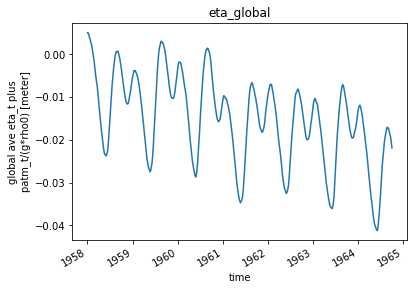

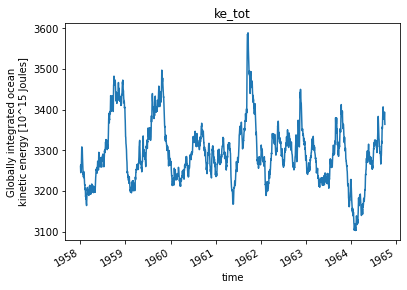

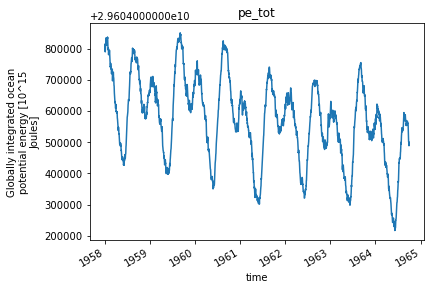

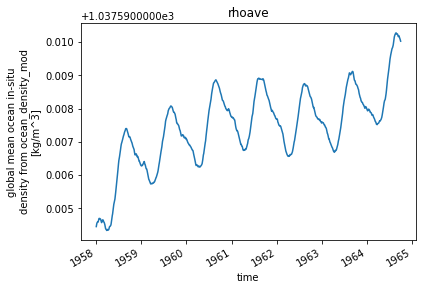

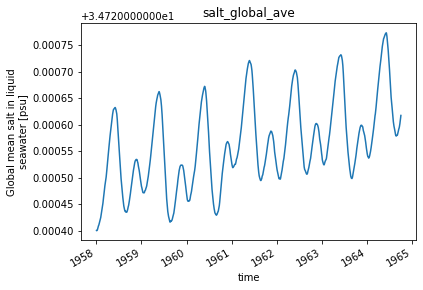

...

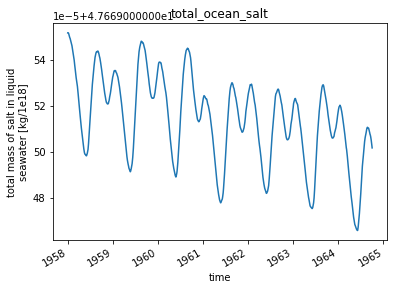

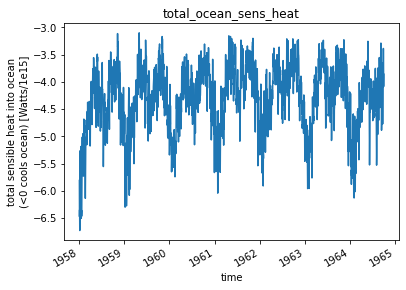

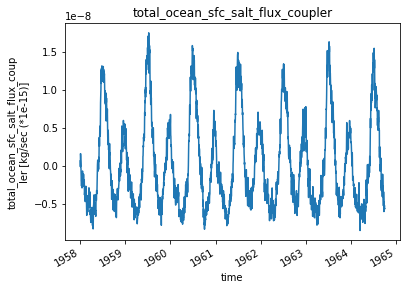

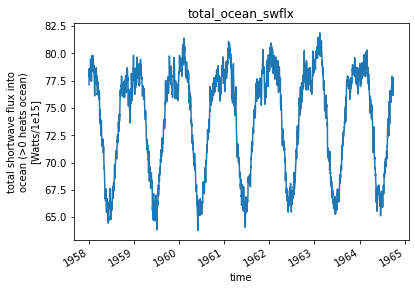

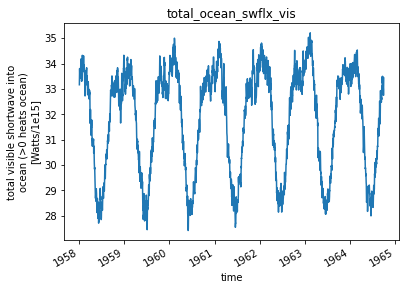

In [8]:
for v in tqdm(scalars, leave=False):  # plot expt only
    plt.figure()
    data = cc.querying.getvar(expt, v, session)
    data.plot()
    plt.axis("tight")
    plt.title(v)

  0%|          | 0/34 [00:00<?, ?it/s]

distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

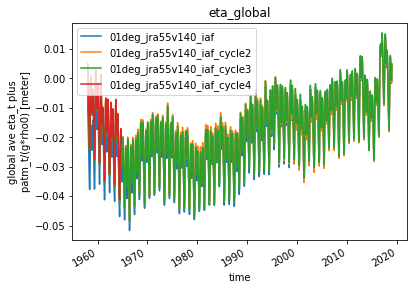

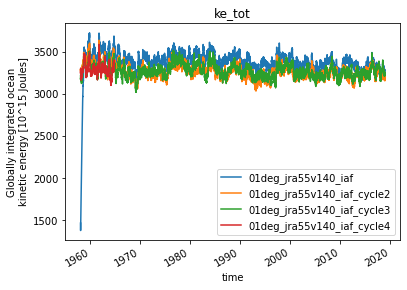

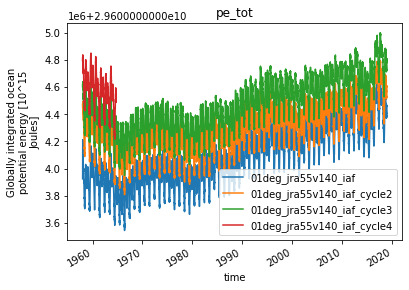

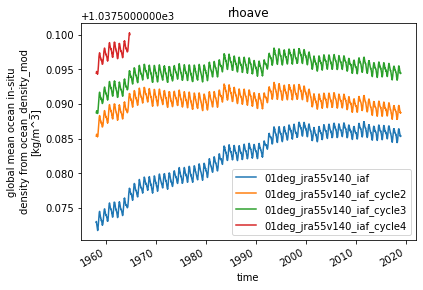

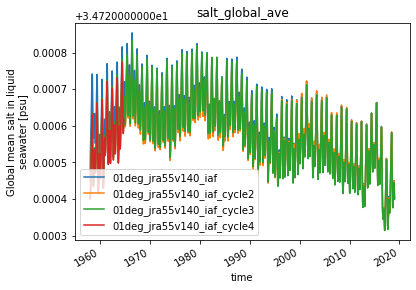

...

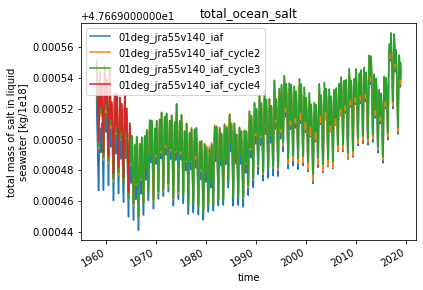

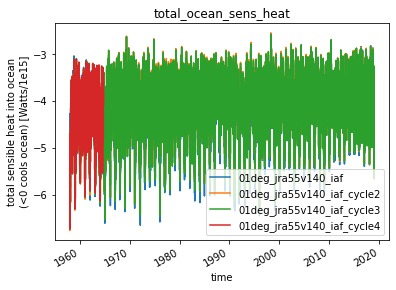

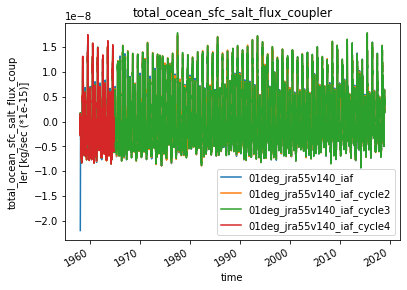

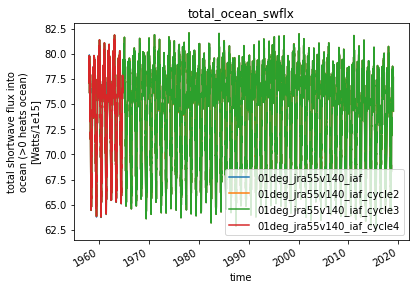

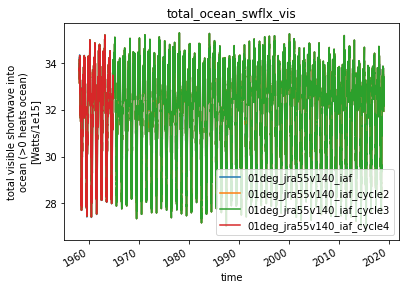

In [9]:
for v in tqdm(scalars, leave=False):  # plot all experiments
    plt.figure()
    for e in expts:
        try:
            data = cc.querying.getvar(e, v, session)
            data.plot(label=e)
        except:
            pass
    plt.axis("tight")
    plt.title(v)
    plt.legend()

## MOM 2D physical

In [10]:
ocean2d = list(set(vs[vs.ncfile.str.contains('ocean-2d-')]['name']))
ocean2d.sort()

  0%|          | 0/74 [00:00<?, ?it/s]

skipped average_DT


distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


skipped average_T1


distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)


skipped average_T2


distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)


skipped nv


distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)


skipped time
skipped time_bnds


distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)


skipped xt_ocean
skipped xu_ocean
skipped yt_ocean
skipped yu_ocean


distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)


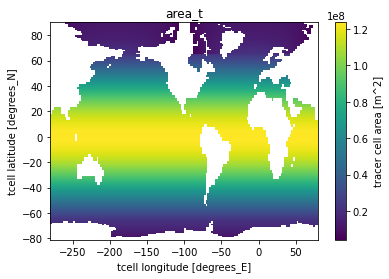

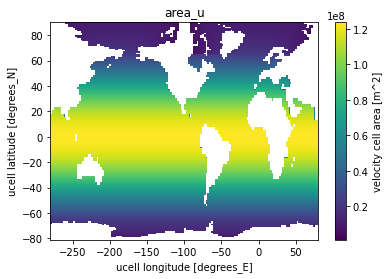

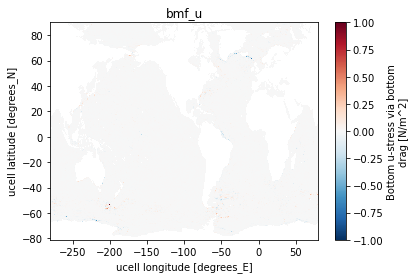

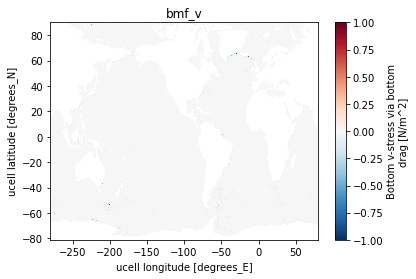

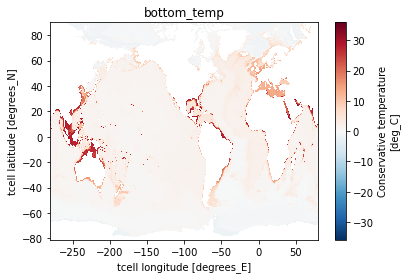

...

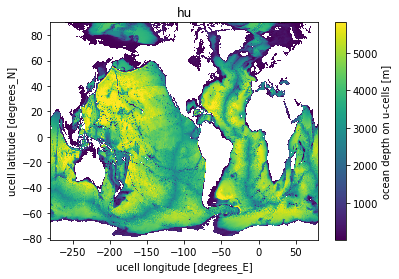

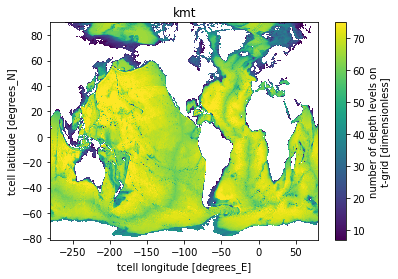

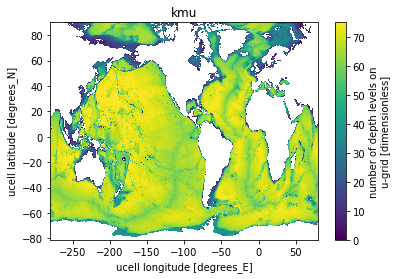

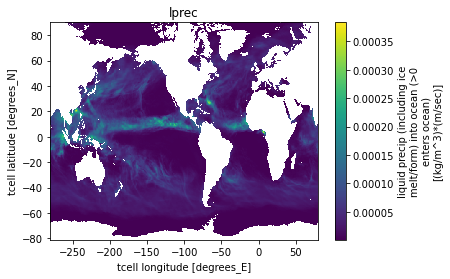

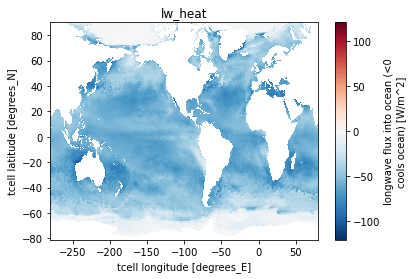

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x1477986736a0>>, <Task finished name='Task-3473426' coro=<Cluster._sync_cluster_info() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/deploy/cluster.py:98> exception=OSError('Timed out trying to connect to tcp://127.0.0.1:39765 after 30 s')>)
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/comm/tcp.py", line 391, in connect
    stream = await self.client.connect(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/tornado/tcpclient.py", line 265, in connect
    addrinfo = await self.resolver.resolve(host, port, af)
asyncio.exceptions.CancelledError

During handling of the above exception, another exception occurred:

Traceback (most re

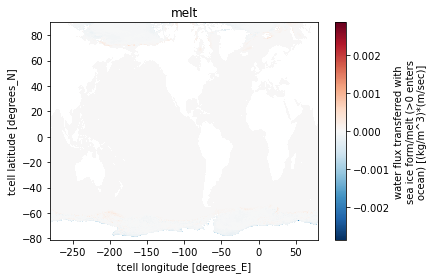

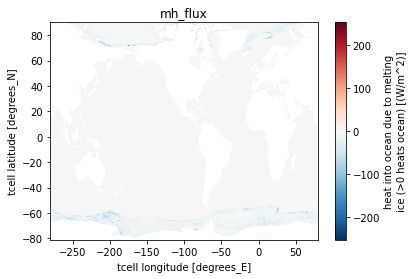

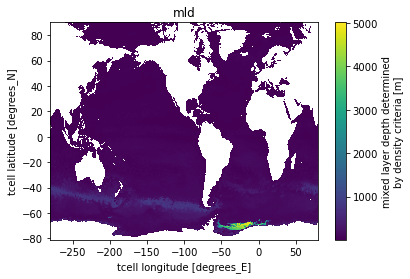

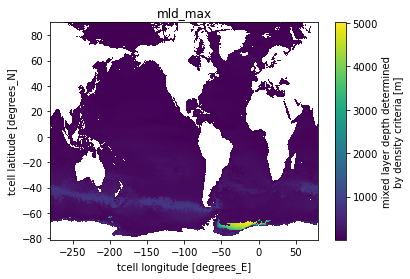

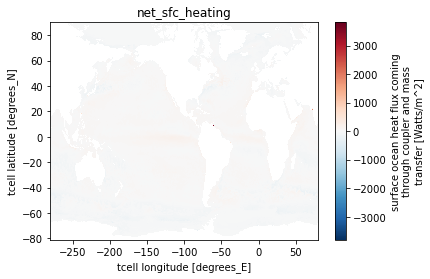

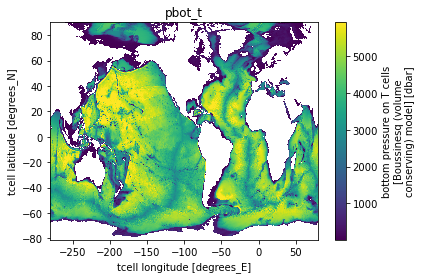

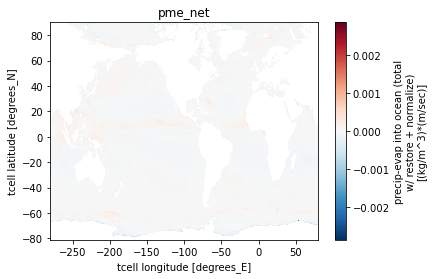

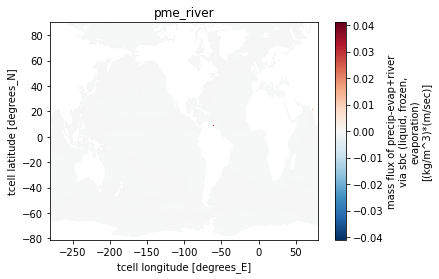

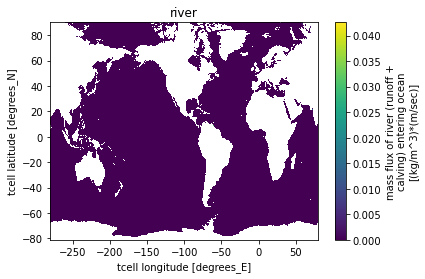

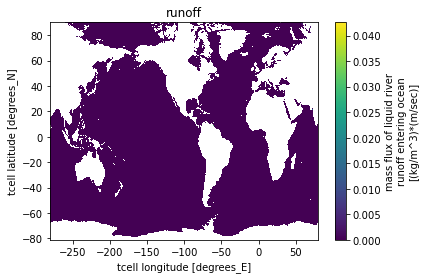

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x1477986736a0>>, <Task finished name='Task-3473436' coro=<Cluster._sync_cluster_info() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/deploy/cluster.py:98> exception=OSError('Timed out trying to connect to tcp://127.0.0.1:39765 after 30 s')>)
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/comm/tcp.py", line 391, in connect
    stream = await self.client.connect(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/tornado/tcpclient.py", line 275, in connect
    af, addr, stream = await connector.start(connect_timeout=timeout)
asyncio.exceptions.CancelledError

During handling of the above exception, another exception occurred:

Traceba

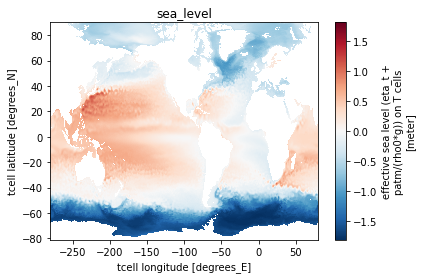

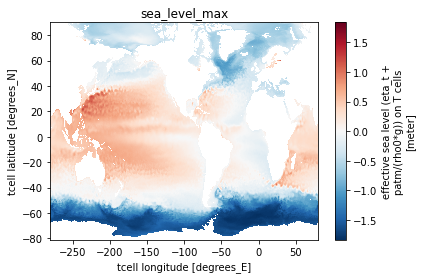

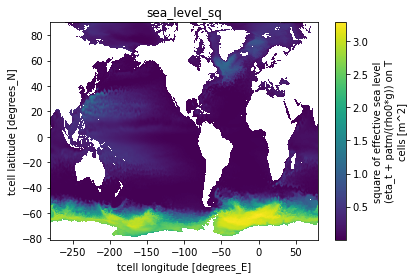

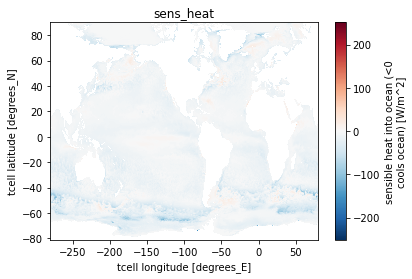

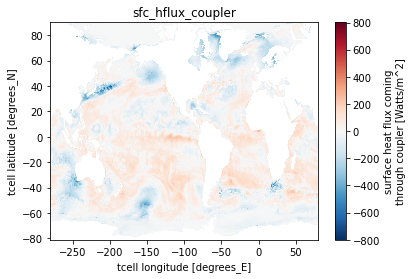

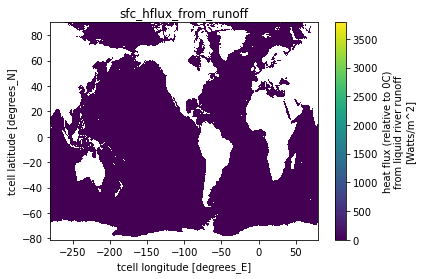

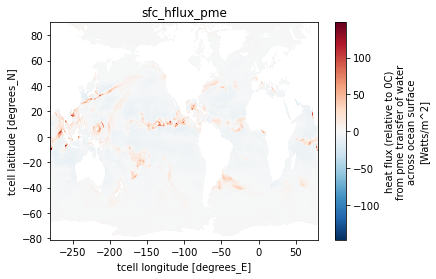

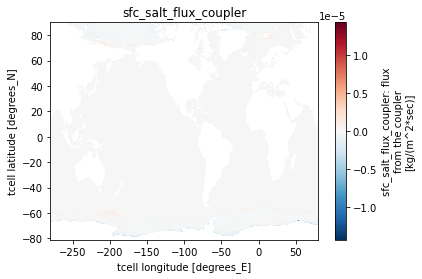

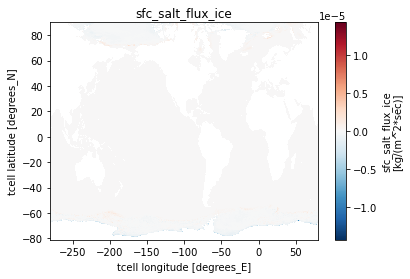

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x1477986736a0>>, <Task finished name='Task-3473450' coro=<Cluster._sync_cluster_info() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/deploy/cluster.py:98> exception=OSError('Timed out trying to connect to tcp://127.0.0.1:39765 after 30 s')>)
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/comm/tcp.py", line 391, in connect
    stream = await self.client.connect(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/tornado/tcpclient.py", line 275, in connect
    af, addr, stream = await connector.start(connect_timeout=timeout)
asyncio.exceptions.CancelledError

During handling of the above exception, another exception occurred:

Traceba

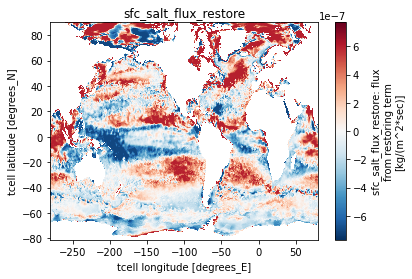

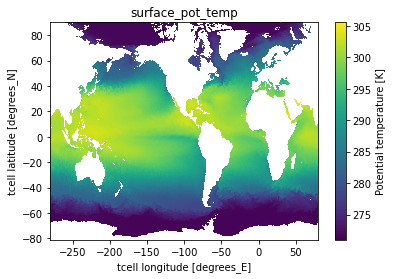

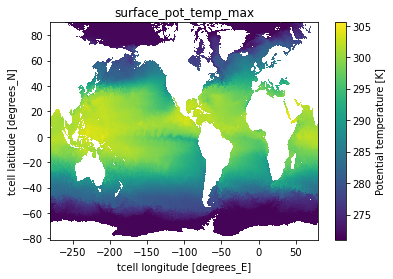

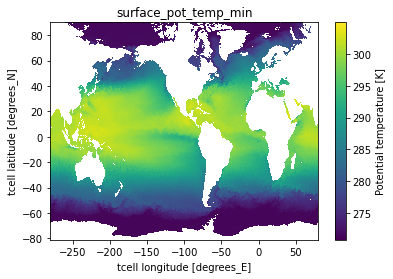

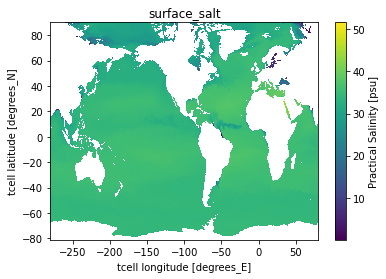

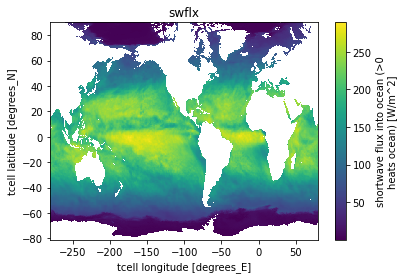

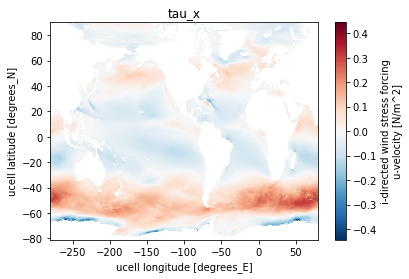

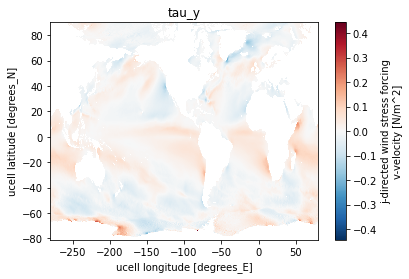

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x1477986736a0>>, <Task finished name='Task-3473465' coro=<Cluster._sync_cluster_info() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/deploy/cluster.py:98> exception=OSError('Timed out trying to connect to tcp://127.0.0.1:39765 after 30 s')>)
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/comm/tcp.py", line 391, in connect
    stream = await self.client.connect(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/tornado/tcpclient.py", line 275, in connect
    af, addr, stream = await connector.start(connect_timeout=timeout)
asyncio.exceptions.CancelledError

During handling of the above exception, another exception occurred:

Traceba

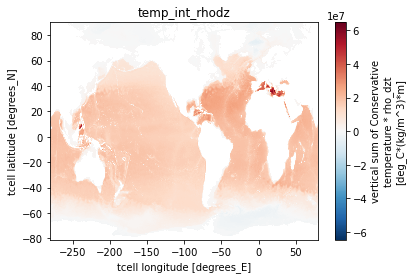

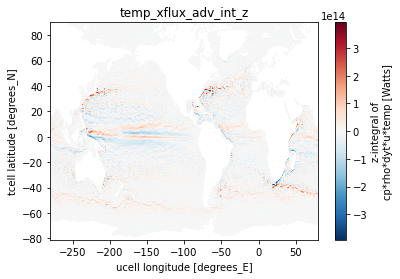

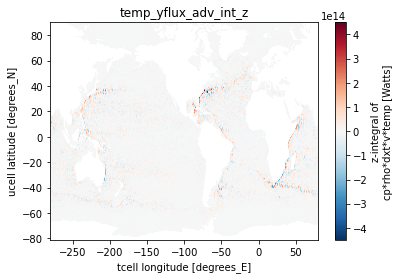

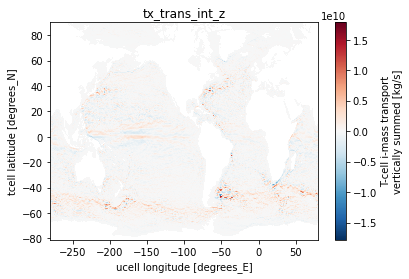

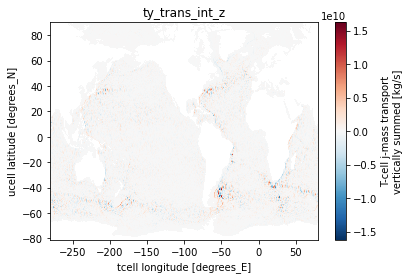

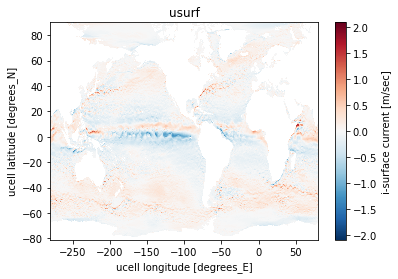

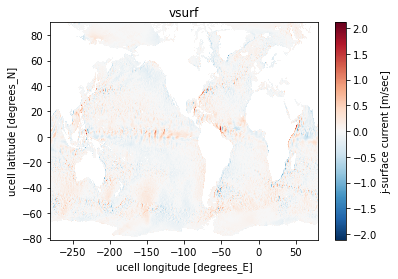

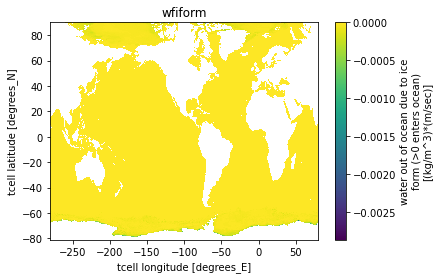

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x1477986736a0>>, <Task finished name='Task-3473485' coro=<Cluster._sync_cluster_info() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/deploy/cluster.py:98> exception=OSError('Timed out trying to connect to tcp://127.0.0.1:39765 after 30 s')>)
Traceback (most recent call last):
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/distributed/comm/tcp.py", line 391, in connect
    stream = await self.client.connect(
  File "/g/data/hh5/public/apps/miniconda3/envs/analysis3-21.07/lib/python3.9/site-packages/tornado/tcpclient.py", line 275, in connect
    af, addr, stream = await connector.start(connect_timeout=timeout)
asyncio.exceptions.CancelledError

During handling of the above exception, another exception occurred:

Traceba

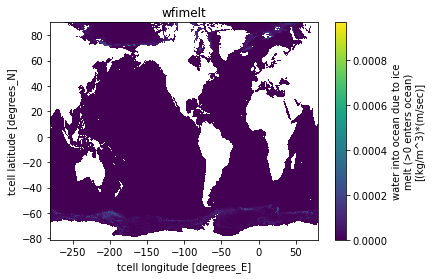

In [11]:
for v in tqdm(ocean2d, leave=False):
    data = cc.querying.getvar(expt, v, session, n=-1)  # NB: last file only
    try:
        data = data.isel(time=-1)  # last time slice
    except:
        pass
    if len(data.shape) == 2:
        try:
            plt.figure()
            data.plot()
            plt.axis("tight")
            plt.title(v)
        except:
            print ('* ERROR in plotting', v)
    else:
        print('skipped', v)

## MOM 2D BGC

In [12]:
oceanbgc2d = list(set(vs[vs.ncfile.str.contains('oceanbgc-2d-')]['name']))
oceanbgc2d.sort()

  0%|          | 0/6 [00:00<?, ?it/s]

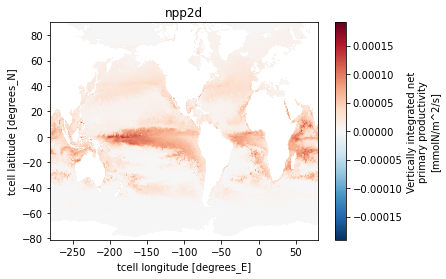

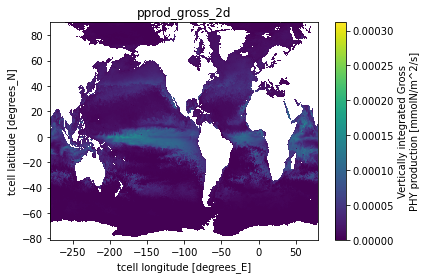

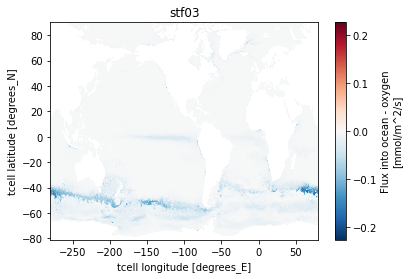

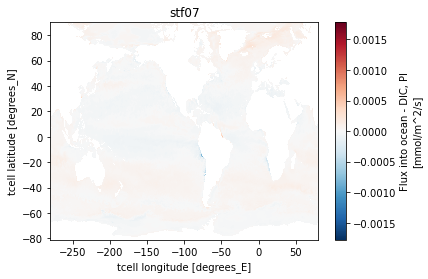

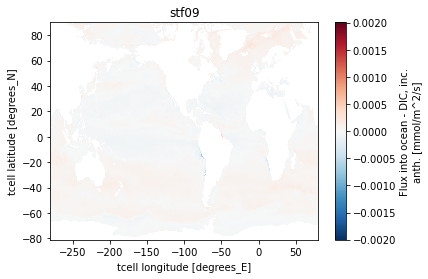

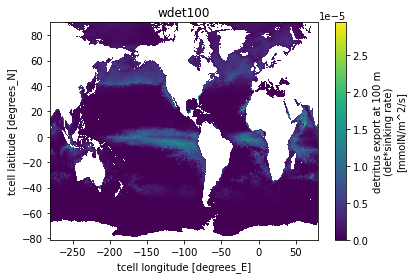

In [13]:
for v in tqdm(oceanbgc2d, leave=False):
    data = cc.querying.getvar(expt, v, session, n=-1)  # NB: last file only
    try:
        data = data.isel(time=-1)  # last time slice
    except:
        pass
    if len(data.shape) == 2:
        try:
            plt.figure()
            data.plot()
            plt.axis("tight")
            plt.title(v)
        except:
            print ('* ERROR in plotting', v)
    else:
        print('skipped', v)

## CICE 2D

In [14]:
cice = list(set(vs[vs.ncfile.str.contains('iceh')]['name']))
cice.sort()

  0%|          | 0/92 [00:00<?, ?it/s]

distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)


skipped NCAT


distributed.utils_perf - WARNING - full garbage collections took 20% CPU time recently (threshold: 10%)


skipped Sinz
skipped Sinz_m


distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)


skipped Tinz
skipped Tinz_m
skipped VGRDi


distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)


skipped aicen_m


distributed.utils_perf - WARNING - full garbage collections took 19% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 18% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 18% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 17% CPU time recently (threshold: 10%)


skipped flatn_ai_m


distributed.utils_perf - WARNING - full garbage collections took 17% CPU time recently (threshold: 10%)


skipped fmelttn_ai_m


distributed.utils_perf - WARNING - full garbage collections took 17% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 17% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 15% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


skipped time
skipped time_bounds
skipped vicen_m


distributed.utils_perf - WARNING - full garbage collections took 14% CPU time recently (threshold: 10%)


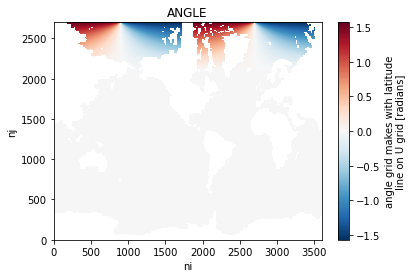

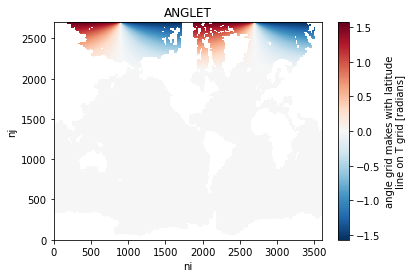

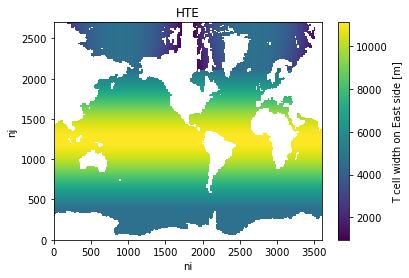

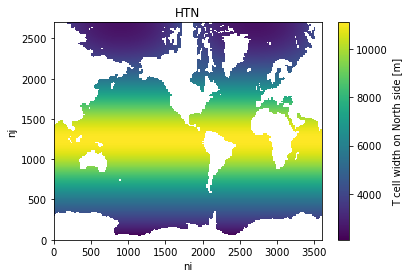

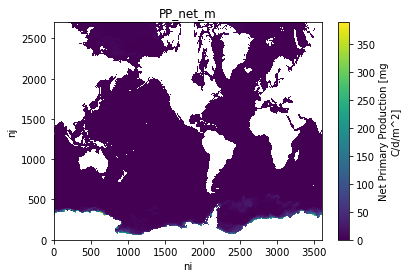

...

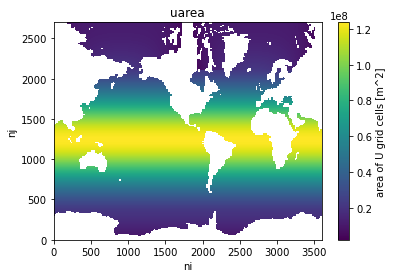

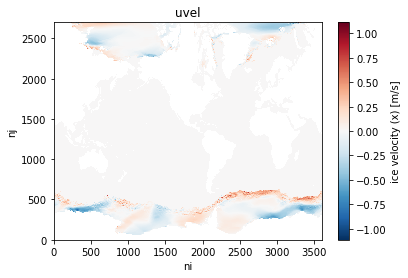

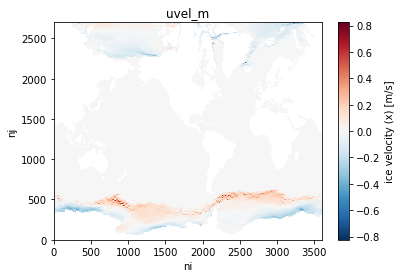

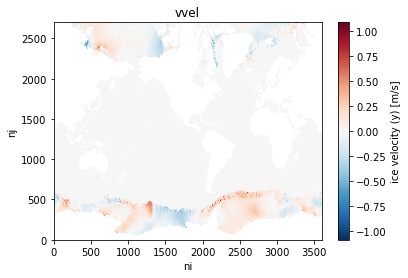

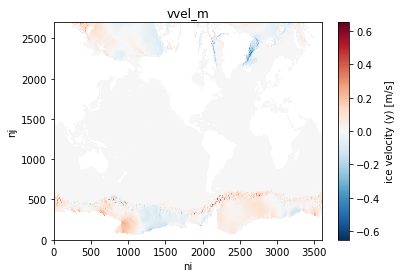

In [15]:
for v in tqdm(cice, leave=False):
    data = cc.querying.getvar(expt, v, session, n=-1)  # NB: last file only
    try:
        data = data.isel(time=-1)  # last time slice
    except:
        pass
    if len(data.shape) == 2:
        try:
            plt.figure()
            data.plot()
            plt.axis("tight")
            plt.title(v)
        except:
            print ('* ERROR in plotting', v)
    else:
        print('skipped', v)